# Feature Analysis

In [1]:
import ROOT as root
import numpy as np
import pandas as pd
import math
from array import array
%jsroot on

Welcome to JupyROOT 6.30/06


In [2]:
filenames = ['10x166GeV_set0.root','10x166GeV_set1.root','10x166GeV_set2.root']
filepath = "/home/yoren/bnl/EIC/Win/"

iOption = 1 # Q2,x ,y
iname = ['Q2','xB','y']

do_qa_draw = 1
do_qa_plots_save = 1

out_folder = "output/QA/"

# toggles
USE_LOG_XB = True
USE_LOG_Y  = False  # only set True if y_min > 0


In [3]:
minQ2 = [1,10,100]
sigmas_ep = [0.199, 4.05e-2, 1.36e-3]
N_ev = [3.32e4, 7.69e4, 6.66e4]

weights = np.array([sigmas_ep[i]/N_ev[i] for i in range(len(sigmas_ep))])
file_weights = dict(zip(filenames, weights))

def_q2_edges = [100, 0.5, 1e4]
def_xb_edges = [1e-4, 1.0, 120]
def_y_edges  = [0.0, 1.0, 120]


res_edges = array('d', np.linspace(-1, 1, 121))

In [4]:
names = ['Q2_res_vs_mc', 'xB_res_vs_mc', 'y_res_vs_mc', 'Q2_vs_mc' , 'xB_vs_mc', 'y_vs_mc']

In [5]:
# methods/pads layout you like
PADS = [(1,"E"), (2,"JB"), (3,"DA"), (4,"Sig"), (5,"ESig")]
Ncols, Nrows = 3, 2  # grid layout

# ---- what and how to draw: key in `histos` -> plotting config ----
# Fill or edit as you like. The key must exist in your `histos` dictionary.
PLOT_SPECS = {
    "Q2_res_vs_mc": {
        "title":          "Q2 residuals vs Q2_mc",
        "x_title_tpl":    "Q2_mc",
        "y_title":        "(Q2_rec - Q2_true)/Q2_true",
        "logx":           True,
        "logy":           False,
        "save_name":      "qa_Q2_res_grid.png",
    },
    "xB_res_vs_mc": {
        "title":          "x_{B} residuals vs x_{B}^{true}",
        "x_title_tpl":    "x_{B}^{true}",
        "y_title":        "(xB_rec - xB_true)/xB_true",
        "logx":           USE_LOG_XB,
        "logy":           False,
        "save_name":      "qa_xB_res_grid.png",
    },
    "y_res_vs_mc": {
        "title":          "y residuals vs y^{true}",
        "x_title_tpl":    "y^{true}",
        "y_title":        "(y_rec - y_true)/y_true",
        "logx":           False,
        "logy":           False,
        "save_name":      "qa_y_res_grid.png",
    },
    "Q2_vs_mc": {
        "title":          "Q2^{method} vs Q2^{true}",
        "x_title_tpl":    "Q2_rec",
        "y_title":        "Q2_true",
        "logx":           True,
        "logy":           True,
        "save_name":      "qa_Q2_vs_mc_grid.png",
    },
    "xB_vs_mc": {
        "title":          "x_{B}^{method} vs x_{B}^{true}",
        "x_title_tpl":    "x_{B}^{rec}",
        "y_title":        "x_{B}^{true}",
        "logx":           USE_LOG_XB,
        "logy":           USE_LOG_XB,
        "save_name":      "qa_xB_vs_mc_grid.png",
    },
    "y_vs_mc": {
        "title":          "y^{method} vs y^{true}",
        "x_title_tpl":    "y^{rec}",
        "y_title":        "y^{true}",
        "logx":           False,
        "logy":           False,
        "save_name":      "qa_y_vs_mc_grid.png",
    },
}


In [6]:
root.gROOT.SetBatch(True)
root.gStyle.SetOptStat(0)

# --- inputs ---
TREE = "T"

METHODS = ["E", "JB", "DA", "Sig", "ESig"]
KIN = ["Q2", "xB", "y"]

def bname(meth, var):
    return f"{meth}_Method_{var}"

def lin_edges(n, lo, hi):
    return array('d', np.linspace(lo, hi, n+1))

def log_edges(n, lo, hi):
    # assumes lo > 0
    return array('d', np.logspace(np.log10(lo), np.log10(hi), n+1))

# Q2 already log-binned (nbins, lo, hi) = (def_q2_edges[0], def_q2_edges[1], def_q2_edges[2])
q2_edges = log_edges(def_q2_edges[0], def_q2_edges[1], def_q2_edges[2])

# xB: (lo, hi, nbins) -> choose log or linear
if USE_LOG_XB:
    xb_edges = log_edges(def_xb_edges[2], def_xb_edges[0], def_xb_edges[1])
else:
    xb_edges = lin_edges(def_xb_edges[2],  def_xb_edges[0], def_xb_edges[1])

# y: (lo, hi, nbins) -> choose log or linear (only valid if lo > 0)
if USE_LOG_Y:
    y_lo = max(def_y_edges[0], 1e-6)  # ensure >0 if you enable log
    y_edges = log_edges(def_y_edges[2], y_lo, def_y_edges[1])
else:
    y_edges = lin_edges(def_y_edges[2],  def_y_edges[0], def_y_edges[1])

all_edges = {"Q2": q2_edges, "xB": xb_edges, "y": y_edges}

def make_h2(df, xexpr, yexpr, name, title, x_edges, y_edges, wexpr=None):
    """Return a detached TH2D from an RDataFrame; optional weight expression."""
    model = root.RDF.TH2DModel(name, title, len(x_edges)-1, x_edges,
                                         len(y_edges)-1, y_edges)
    if wexpr is None:
        hptr = df.Histo2D(model, xexpr, yexpr)
    else:
        hptr = df.Histo2D(model, xexpr, yexpr, wexpr)  # weighted fill
    h = hptr.GetValue()
    h.SetDirectory(0)
    return h

In [7]:
# helpers
def with_res(df, m, v):
    rec, tru = bname(m, v), f"mc_{v}"
    return df.Define(f"{m}_{v}_res", f"({rec}-{tru})/({tru})")

def add_hist(hdict, key, hnew):
    if key in hdict:
        hdict[key].Add(hnew)
    else:
        hdict[key] = hnew

# histos['Q2_vs_mc'][method] -> TH2D of Q2_method vs mc_Q2
# histos['Q2_res_vs_rec'][method] -> TH2D of (rec-true)/true vs Q2_rec
histos = {
    "Q2_vs_mc": {}, "xB_vs_mc": {}, "y_vs_mc": {},
    "Q2_res_vs_mc": {}, "xB_res_vs_mc": {}, "y_res_vs_mc": {},
}

# ----- loop over files, fill weighted histos, and merge -----
for fname, w in file_weights.items():
    f = root.TFile.Open(filepath + fname)
    rdf = root.RDataFrame(TREE, f).Define("w", str(float(w)))  # constant per-file weight

    # method vs truth
    for m in METHODS:
        h = make_h2(
            rdf, bname(m,"Q2"), "mc_Q2",
            name=f"h2_{m}_Q2_vs_mc__{fname}", title=f"{m} Q2 vs mc_Q2",
            x_edges=q2_edges, y_edges=q2_edges, wexpr="w"
        )
        add_hist(histos["Q2_vs_mc"], m, h)

        h = make_h2(
            rdf, bname(m,"xB"), "mc_xB",
            name=f"h2_{m}_xB_vs_mc__{fname}", title=f"{m} xB vs mc_xB",
            x_edges=xb_edges, y_edges=xb_edges, wexpr="w"
        )
        add_hist(histos["xB_vs_mc"], m, h)

        h = make_h2(
            rdf, bname(m,"y"), "mc_y",
            name=f"h2_{m}_y_vs_mc__{fname}", title=f"{m} y vs mc_y",
            x_edges=y_edges, y_edges=y_edges, wexpr="w"
        )
        add_hist(histos["y_vs_mc"], m, h)

    # residual columns on-the-fly: (rec - true)/true
    for m in METHODS:
        # Q2 residual vs TRUE  (x = mc_Q2, y = residual)
        rdf_q2 = with_res(rdf, m, "Q2")
        h = make_h2(
            rdf_q2, "mc_Q2", f"{m}_Q2_res",
            name=f"h2_{m}_Q2res_vs_true__{fname}",
            title=f"{m}: (Q2_rec - Q2_true)/Q2_true vs Q2_true",
            x_edges=q2_edges, y_edges=res_edges, wexpr="w"
        )
        add_hist(histos["Q2_res_vs_mc"], m, h)
        
        # xB residual vs TRUE  (x = mc_xB, y = residual)
        rdf_xb = with_res(rdf, m, "xB")
        h = make_h2(
            rdf_xb, "mc_xB", f"{m}_xB_res",
            name=f"h2_{m}_xBres_vs_true__{fname}",
            title=f"{m}: (xB_rec - xB_true)/xB_true vs xB_true",
            x_edges=xb_edges, y_edges=res_edges, wexpr="w"
        )
        add_hist(histos["xB_res_vs_mc"], m, h)
        
        # y residual vs TRUE  (x = mc_y, y = residual)
        rdf_y = with_res(rdf, m, "y")
        h = make_h2(
            rdf_y, "mc_y", f"{m}_y_res",
            name=f"h2_{m}_yres_vs_true__{fname}",
            title=f"{m}: (y_rec - y_true)/y_true vs y_true",
            x_edges=y_edges, y_edges=res_edges, wexpr="w"
        )
        add_hist(histos["y_res_vs_mc"], m, h)


    f.Close()

# 'histos' now contains the merged, weighted TH2Ds per method.


In [8]:
def draw_grid_from_histos(histos, key, pads=PADS, ncols=Ncols, nrows=Nrows,
                          title=None, x_title_tpl="{m}", y_title="",
                          logx=False, logy=False, save_name=None,
                          do_draw=True, do_save=False, out_folder=""):
    """
    Draws a grid of 2D histos for each method (pads order given), using histos[key][method].
    """
    if key not in histos:
        raise KeyError(f"'{key}' not found in histos. Available keys: {list(histos.keys())}")
    c = root.TCanvas(f"c_{key}", f"c_{key}", 1450, 900)
    c.Divide(ncols, nrows)

    for ipad, m in pads:
        c.cd(ipad)
        if logx: root.gPad.SetLogx(True)
        if logy: root.gPad.SetLogy(True)
        h = histos[key][m]
        h.GetXaxis().SetTitle(x_title_tpl)#x_title_tpl.format(m=m))
        h.GetYaxis().SetTitle(y_title)
        h.Draw("COLZ")

    # last pad: big title
    c.cd(ncols*nrows)
    lat = root.TLatex()
    lat.SetNDC(True); lat.SetTextSize(0.05)
    lat.DrawLatex(0.15, 0.92, title if title else key)

    if do_draw: c.Draw()
    if do_save and save_name:
        c.SaveAs(out_folder + save_name)
    return c


In [9]:
# ---------- slice+fit helpers ----------

def _fit_gaus_plus_pol1(h1, name="f", nsig_range=2.5, quiet=True):
    """
    Fit a TH1 to gaus(0)+pol1(3) within [mean±nsig*RMS].
    Returns (mu, mu_err, sigma, sigma_err, fitobj) or (None, ... ) on failure.
    """
    import math, ROOT as root
    if h1.GetEffectiveEntries() <= 0 or h1.Integral() <= 0:
        return (None,)*5

    mu0  = h1.GetMean()
    sig0 = h1.GetRMS()
    if not math.isfinite(mu0) or not math.isfinite(sig0) or sig0 <= 0:
        return (None,)*5

    y1 = max(mu0 - nsig_range*sig0, h1.GetXaxis().GetXmin())
    y2 = min(mu0 + nsig_range*sig0, h1.GetXaxis().GetXmax())
    if y2 <= y1:
        return (None,)*5

    f = root.TF1(name, "gaus(0)+pol1(3)", y1, y2)
    A0 = max(h1.GetMaximum(), 1.0)
    f.SetParameters(A0, mu0, max(sig0, 1e-3), 0.0, 0.0)
    f.SetParLimits(2, 1e-4, 1e2)  # sigma>0
    f.SetNpx(300)

    # === key change: include 'S' so TFitResult is not empty ===
    opt = ("QRSN" if quiet else "RSN")
    res = h1.Fit(f, opt)

    # robustly read status
    status = 0
    try:
        status = int(res.Status())
    except Exception:
        try:
            status = int(res)  # older bindings
        except Exception:
            status = 0

    if status != 0:
        return (None,)*5

    mu, muerr = f.GetParameter(1), f.GetParError(1)
    sg, sgerr = abs(f.GetParameter(2)), f.GetParError(2)
    return mu, muerr, sg, sgerr, f



def slice_fit_graphs_gaus_pol1(h2, min_eff_entries=200, nsig_range=2.5, quiet=True,
                               use_fallback=True, name_tag="Q2res", rebin = 1):
    """
    For each X bin of TH2 h2, fit Y-projection with gaus+pol1 if enough entries.
    Returns:
      g_mu_sigmaErr : TGraphErrors of mean vs X with Y-error = sigma (std dev)
      g_sigma       : TGraphErrors of sigma vs X with fit error
    If fit fails and use_fallback=True, falls back to (mean, RMS).
    """
    ax = h2.GetXaxis()
    g_mu = root.TGraphErrors(); g_mu.SetName(f"g_{name_tag}_mu")
    g_sg = root.TGraphErrors(); g_sg.SetName(f"g_{name_tag}_sigma")

    ip = 0
    for ix in range(0, int(ax.GetNbins()/rebin)):
        # Y-projection for a single X-bin; "e" keeps sumw2/stat
        proj = h2.ProjectionY(f"py_{h2.GetName()}_{ix}", ix*rebin + 1, (ix+1)*rebin, "e")
        eff = proj.GetEffectiveEntries()
        if eff < min_eff_entries or proj.Integral() <= 0:
            continue

        mu, muerr, sg, sgerr, fobj = _fit_gaus_plus_pol1(
            proj, name=f"f_{h2.GetName()}_{ix}", nsig_range=nsig_range, quiet=quiet
        )

        if mu is None and use_fallback:
            # weighted fallback
            mu, muerr = proj.GetMean(), proj.GetMeanError()
            sg, sgerr = proj.GetRMS(),  proj.GetRMSError()

            # If still not finite, skip
            if not (math.isfinite(mu) and math.isfinite(sg)):
                continue
            muerr = muerr if math.isfinite(muerr) else 0.0
            sgerr = sgerr if math.isfinite(sgerr) else 0.0
        elif mu is None:
            continue

        x  = ax.GetBinCenter(ix*rebin + 1)/2.0 + ax.GetBinCenter((ix+1)*rebin)/2.0
        ex = ax.GetBinWidth(ix*rebin + 1)/2.0 + (ax.GetBinCenter((ix+1)*rebin) - ax.GetBinCenter(ix*rebin + 1))/2.0

        # Curve 1: mean with error bars equal to sigma (std dev) as requested
        g_mu.SetPoint(ip, x, mu)
        g_mu.SetPointError(ip, ex, sg)

        # Curve 2: sigma(x) with its own fit error
        g_sg.SetPoint(ip, x, sg)
        g_sg.SetPointError(ip, ex, sgerr)

        ip += 1

    # styles
    for g in (g_mu,):
        g.SetMarkerStyle(20)
        g.SetMarkerColor(root.kMagenta)
        g.SetLineColor(root.kMagenta)
        g.SetMarkerSize(0.8)
        g.SetLineWidth(2)
    for g in (g_sg,):
        g.SetMarkerStyle(24)
        g.SetMarkerColor(root.kMagenta)
        g.SetLineColor(root.kMagenta)
        g.SetMarkerSize(0.8)
        g.SetLineWidth(2)

    return g_mu, g_sg


In [10]:
print(histos.keys(),names[iOption+3])

dict_keys(['Q2_vs_mc', 'xB_vs_mc', 'y_vs_mc', 'Q2_res_vs_mc', 'xB_res_vs_mc', 'y_res_vs_mc']) xB_vs_mc


In [11]:
# Example: Q2 residuals grid
cfg = PLOT_SPECS[names[iOption+3]]
c = draw_grid_from_histos(
    histos, key=names[iOption+3],
    title=cfg["title"], x_title_tpl=cfg["x_title_tpl"], y_title=cfg["y_title"],
    logx=cfg["logx"], logy=cfg["logy"],
    save_name=cfg["save_name"],
    do_draw=do_qa_draw, do_save=do_qa_plots_save, out_folder=out_folder
)
#c.Draw()

Info in <TCanvas::Print>: png file output/QA/qa_xB_vs_mc_grid.png has been created


In [12]:
## Example: Q2 residuals grid
#cfg = PLOT_SPECS["Q2_res_vs_mc"]
#c = draw_grid_from_histos(
#    histos, key="Q2_res_vs_mc",
#    title=cfg["title"], x_title_tpl=cfg["x_title_tpl"], y_title=cfg["y_title"],
#    logx=cfg["logx"], logy=cfg["logy"],
#    save_name=cfg["save_name"],
#    do_draw=do_qa_draw, do_save=do_qa_plots_save, out_folder=out_folder
#)


In [13]:
profiles = {f"{iname[iOption]}_res_vs_mc_prof": {}}
for m in METHODS:
    h2 = histos[names[iOption]][m]
    p  = h2.ProfileX(f"p_{m}_Q2res_vs_mc")  # per x-bin <res>, uses y-bin centers & contents
    p.SetErrorOption("s")   # "s": show RMS (std dev) as error bar; use "s1" for unbiased RMS
    p.SetMarkerStyle(20)
    #p.SetMarkerColor(root.kRed)
    #p.SetLineColor(root.kRed)
    p.SetMarkerSize(0.8)
    p.SetLineWidth(2)
    profiles[f"{iname[iOption]}_res_vs_mc_prof"][m] = p

cfg = PLOT_SPECS[names[iOption]]
c = draw_grid_from_histos(
    histos, key=names[iOption],
    title=cfg["title"],
    x_title_tpl=cfg["x_title_tpl"],
    y_title=cfg["y_title"],
    logx=cfg["logx"], logy=cfg["logy"],
    save_name=None,  # draw first, save later after overlay
    do_draw=True, do_save=False, out_folder=out_folder
)

# Overlay the profiles (assumes draw_grid_from_histos puts METHODS in order)
root.gStyle.SetErrorX(0)  # hide horizontal error bars
pads = len(METHODS)
for i, m in enumerate(METHODS, start=1):
    c.cd(i)
    if cfg.get("logx", False):
        root.gPad.SetLogx()
    p = profiles[f"{iname[iOption]}_res_vs_mc_prof"][m]
    # ensure nice axes
    p.GetXaxis().SetTitle(cfg.get("x_title_tpl","mc Q^{2}"))
    p.GetYaxis().SetTitle(cfg.get("y_title","(Q^{2}_{rec}-Q^{2}_{true})/Q^{2}_{true}"))
    p.Draw("E1 SAME")

if do_qa_plots_save:
    out = f"{out_folder}/{cfg['save_name'].replace('.png','_prof.png')}"
    c.SaveAs(out)

Info in <TCanvas::Print>: png file output/QA//qa_xB_res_grid_prof.png has been created


In [14]:
# Build slice-fits for each method
slice_curves = {}         # method -> (g_mu_sigmaErr, g_sigma)
for m in METHODS:
    h2 = histos[names[iOption]][m]   # x=mc_Q2, y=(rec-true)/true (weighted)
    g_mu, g_sg = slice_fit_graphs_gaus_pol1(
        h2, min_eff_entries=20, nsig_range=2.5, quiet=True,
        use_fallback=True, name_tag=f"{m}_Q2res", rebin = 2
    )
    slice_curves[m] = (g_mu, g_sg)

# Draw your existing heatmap grid first
cfg = PLOT_SPECS[names[iOption]]
c = draw_grid_from_histos(
    histos, key=names[iOption],
    title=cfg["title"], x_title_tpl=cfg["x_title_tpl"], y_title=cfg["y_title"],
    logx=cfg["logx"], logy=cfg["logy"],
    save_name=None,  # overlay then save
    do_draw=True, do_save=False, out_folder=out_folder
)

# Overlay per-method curves
root.gStyle.SetErrorX(0)  # hide horizontal error bars
for i, m in enumerate(METHODS, start=1):
    pad = c.cd(i)
    if cfg.get("logx", False):
        pad.SetLogx()
    g_mu, g_sg = slice_curves[m]

    # Mean with error bars = sigma
    g_mu.SetTitle("")
    g_mu.Draw("E1 SAME")

    # Optionally draw sigma curve too:
    # g_sg.Draw("E1 SAME")

# Save
if do_qa_plots_save:
    c.SaveAs(f"{out_folder}/{cfg['save_name'].replace('.png','_slicefit_mu_sigmaErr.png')}")


Warning in <TCanvas::Constructor>: Deleting canvas with same name: c_xB_res_vs_mc
Info in <TCanvas::Print>: png file output/QA//qa_xB_res_grid_slicefit_mu_sigmaErr.png has been created


In [15]:

file_minQ2   = dict(zip(filenames, minQ2))

# columns to pull from the TTree
cols_base = ["mc_Q2", "mc_xB", "mc_y"]
cols_rec  = [bname(m, v) for m in METHODS for v in KIN]
cols_all  = cols_base + cols_rec + ["w"]  # "w" will be defined per file

dfs = []
for fname in filenames:
    w = float(file_weights[fname])
    rdf = root.RDataFrame(TREE, filepath + fname).Define("w", str(w))  # constant weight per event

    # Pull arrays into numpy and build a pandas DataFrame
    arrs = rdf.AsNumpy(cols_all)   # dict: col -> np.ndarray
    df   = pd.DataFrame(arrs)

    # Useful metadata columns
    df["file"]  = fname
    df["minQ2"] = file_minQ2[fname]

    dfs.append(df)

# One big DataFrame with per-event weights in column "w"
df_all = pd.concat(dfs, ignore_index=True)

# Optional: add residuals in pandas (same defs as before)
for m in METHODS:
    for v in KIN:
        df_all[f"{m}_{v}_res"] = (df_all[bname(m, v)] - df_all[f"mc_{v}"]) / df_all[f"mc_{v}"]

print(df_all.head())
print("Total events:", len(df_all), "   sum of weights:", df_all["w"].sum())


      mc_Q2     mc_xB      mc_y  E_Method_Q2  E_Method_xB  E_Method_y  \
0  9.301528  0.011520  0.121152     8.645180     0.007137    0.182430   
1  4.664818  0.010422  0.067158     4.513665     0.006776    0.100322   
2  2.350901  0.001594  0.221240     2.394092     0.001709    0.210959   
3  2.221734  0.000618  0.539635     2.225050     0.000623    0.537874   
4  2.170262  0.002454  0.132709     2.172282     0.002441    0.134034   

   JB_Method_Q2  JB_Method_xB  JB_Method_y  DA_Method_Q2  ...  JB_y_res  \
0      5.778313      0.013127     0.066295      9.676182  ... -0.452793   
1      5.140941      0.011839     0.065400      4.702705  ... -0.026185   
2      1.209697      0.001636     0.111326      2.556114  ... -0.496809   
3      1.657180      0.001146     0.217816      3.391198  ... -0.596364   
4      0.679293      0.001179     0.086737      2.135961  ... -0.346408   

   DA_Q2_res  DA_xB_res  DA_y_res  Sig_Q2_res  Sig_xB_res  Sig_y_res  \
0   0.040279   0.489430 -0.298987   -0

In [16]:
# ---- 2D histogram helper (weighted) ----
def h2_weighted(df, x_col, y_col, x_edges, y_edges, w_col="w"):
    H, xe, ye = np.histogram2d(
        df[x_col].values,
        df[y_col].values,
        bins=(np.asarray(x_edges, dtype=float), np.asarray(y_edges, dtype=float)),
        weights=df[w_col].values
    )
    return H, xe, ye

# ---- weighted profile helper (mean with +/- RMS as error) ----
def weighted_profile(df, x_col, y_col, w_col, x_edges, min_eff=200):
    """
    Bin x by x_edges; for each bin compute:
      - weighted mean of y
      - weighted RMS of y (used as 'error bar')
      - effective entries n_eff = (sum w)^2 / sum(w^2)
    Returns a tidy DataFrame with one row per x-bin (that passes min_eff).
    """
    x_edges = np.asarray(x_edges, dtype=float)
    centers = 0.5 * (x_edges[:-1] + x_edges[1:])
    halfw   = 0.5 * (x_edges[1:] - x_edges[:-1])

    # bin index for each row
    idx = np.digitize(df[x_col].values, x_edges) - 1

    rows = []
    for i in range(len(x_edges) - 1):
        mask = (idx == i)
        if not mask.any():
            continue
        y = df.loc[mask, y_col].values
        w = df.loc[mask, w_col].values
        sw = w.sum()
        sw2 = (w*w).sum()
        if sw <= 0 or sw2 <= 0:
            continue
        n_eff = (sw*sw) / sw2
        if n_eff < min_eff:
            continue

        mu = np.average(y, weights=w)
        var = np.average((y - mu)**2, weights=w)
        sd = np.sqrt(max(var, 0.0))

        rows.append({
            "x": centers[i],
            "ex": halfw[i],
            "mean": mu,
            "rms": sd,
            "n_eff": n_eff,
            "w_sum": sw
        })

    return pd.DataFrame(rows)

# ------------------------------------------------------------------
# EXAMPLE: replicate your Q2_res_vs_mc QA in pandas/NumPy
# x = mc_Q2, y = (rec - true)/true for each method; errors = RMS in bin
# ------------------------------------------------------------------

# edges you already defined earlier in ROOT side; ensure numpy arrays here
q2_edges_np = all_edges[iname[iOption]]
print(q2_edges_np)

profiles_q2 = {}
h2_q2 = {}

for m in METHODS:
    # 1) weighted 2D histogram (optional; for heatmap)
    H, xe, ye = h2_weighted(
        df_all,
        x_col=f"mc_{iname[iOption]}",
        y_col=f"{m}_{iname[iOption]}_res",
        x_edges=q2_edges_np,
        y_edges=res_edges,
        w_col="w"
    )
    h2_q2[m] = (H, xe, ye)

    # 2) profile: mean ± RMS of residual in bins of mc_Q2
    prof = weighted_profile(
        df_all,
        x_col=f"mc_{iname[iOption]}",
        y_col=f"{m}_{iname[iOption]}_res",
        w_col="w",
        x_edges=q2_edges_np,
        min_eff=200     # tune as you like; effective entries threshold
    )
    prof["method"] = m
    profiles_q2[m] = prof

# If you want a single tidy table for plotting/exports:
profiles_q2_all = pd.concat(profiles_q2.values(), ignore_index=True)
print(profiles_q2_all.head())


array('d', [0.0001, 0.00010797751623277094, 0.00011659144011798323, 0.00012589254117941674, 0.00013593563908785255, 0.0001467799267622069, 0.00015848931924611142, 0.0001711328304161781, 0.00018478497974222906, 0.00019952623149688788, 0.00021544346900318845, 0.00023263050671536262, 0.00025118864315095795, 0.000271227257933203, 0.00029286445646252375, 0.00031622776601683794, 0.0003414548873833601, 0.00036869450645195733, 0.00039810717055349735, 0.0004298662347082277, 0.00046415888336127773, 0.0005011872336272725, 0.0005411695265464637, 0.0005843414133735175, 0.000630957344480193, 0.0006812920690579615, 0.0007356422544596414, 0.0007943282347242813, 0.0008576958985908946, 0.0009261187281287938, 0.001, 0.0010797751623277093, 0.0011659144011798312, 0.0012589254117941675, 0.0013593563908785254, 0.0014677992676220704, 0.001584893192461114, 0.001711328304161781, 0.0018478497974222907, 0.001995262314968879, 0.002154434690031882, 0.0023263050671536263, 0.0025118864315095794, 0.0027122725793320298

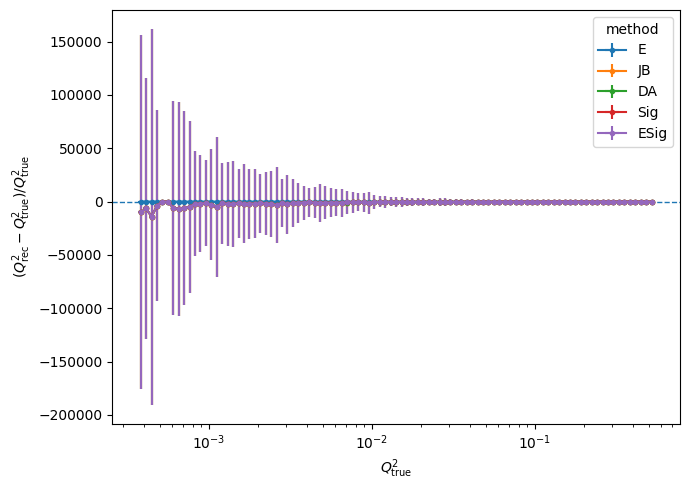

In [17]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7,5))
for m, prof in profiles_q2.items():
    if len(prof)==0: 
        continue
    # errorbar with yerr = RMS, xerr = half bin width
    plt.errorbar(prof["x"], prof["mean"], xerr=prof["ex"], yerr=prof["rms"],
                 fmt="o-", lw=1.5, ms=3, label=m)

plt.xscale("log")
plt.axhline(0, ls="--", lw=1)
plt.xlabel(r"$Q^2_{\rm true}$")
plt.ylabel(r"$(Q^2_{\rm rec}-Q^2_{\rm true})/Q^2_{\rm true}$")
plt.legend(title="method")
plt.tight_layout()
plt.show()


In [18]:
data = df_all
data = df_all.sample(frac=1, random_state=42).reset_index(drop=True)
data.head()

,mc_Q2,mc_xB,mc_y,E_Method_Q2,E_Method_xB,E_Method_y,JB_Method_Q2,JB_Method_xB,JB_Method_y,DA_Method_Q2,...,JB_y_res,DA_Q2_res,DA_xB_res,DA_y_res,Sig_Q2_res,Sig_xB_res,Sig_y_res,ESig_Q2_res,ESig_xB_res,ESig_y_res
0,275.721313,0.212466,0.194993,284.692261,0.253871,0.168886,160.835831,0.166622,0.145372,278.606384,...,-0.254475,0.010464,0.058034,-0.042771,0.008257,0.323640,-0.236522,0.032536,0.323640,-0.218138
1,2.029314,0.001858,0.164103,1.977486,0.001610,0.184982,1.037229,0.000980,0.159473,1.916457,...,-0.028213,-0.055613,-0.260802,0.280512,-0.050397,-0.045572,-0.002774,-0.025540,-0.045572,0.023330
2,12.145138,0.052914,0.034488,12.251526,0.069901,0.026396,1.724555,0.024779,0.010481,12.235435,...,-0.696086,0.007435,0.258334,-0.197554,-0.007294,2.221790,-0.691171,0.008760,2.221790,-0.686177
3,115.265205,0.058091,0.297734,115.604836,0.058875,0.295718,98.710152,0.057888,0.256807,118.590286,...,-0.137460,0.028847,0.107810,-0.067859,-0.036079,0.078009,-0.102540,0.002947,0.078009,-0.066205
4,2.429521,0.000527,0.692675,2.407033,0.000521,0.696433,0.746467,0.000578,0.194387,4.648214,...,-0.719368,0.913222,2.210097,-0.402632,-0.506655,-0.122600,-0.436429,-0.009256,-0.122600,0.131771


In [19]:
print(data.size, data.shape)

17157060 (476585, 36)


+ Видим, что impressions имеют только одно значение, поэтому их можно удалить.
+ Таргет-переменная clicks сильно несбалансирована. Возможно, стоит использовать балансировку весов, а также в качестве оценки моделей использовать f1 и ROC AUC.
+ У campaign_clicks нулевых значений сильно больше, чем ненулевых, следовательно, можно трансформировать в бинарную фичу
+ os_id со значениями больше 6 встречается редко, можно объединить в одну категорию
+ Аналогично с редкими значениями zone_id

# Feature Engineering

In [20]:
def feature_engineering(data: pd.DataFrame) -> pd.DataFrame:
    # делим выборку на train и test
    #data = data.sort_values(by='date_time', ignore_index=True)
    #cut_off_val = data[data['date_time'] < pd.to_datetime('2021-10-01')].index[-1]
    #cut_off_test = data[data['date_time'] < pd.to_datetime('2021-10-02')].index[-1]

    cut_off_val =  int (data.shape[0]/3)
    cut_off_test = int (data.shape[0]/3*2 + 1)

    print(cut_off_val,cut_off_test)

    y = data['mc_{}'.format(iname[iOption])]
    y_train, y_test = y.iloc[:cut_off_test], y.iloc[cut_off_test:]
    w_train, w_test = data['w'].iloc[:cut_off_test], data['w'].iloc[cut_off_test:]
    data = data.drop(columns = ['w'])
    data = data.drop(columns = ['mc_Q2','mc_xB','mc_y', 'file', 'minQ2'])
    drop_cols = [c for c in data.columns if c.endswith('_res')]
    data = data.drop(columns=drop_cols)
    data_train, data_test = data[:cut_off_test], data[cut_off_test:]
    #adding weights from 'w' in df

    # делаем one hot encodings
    #enc = OneHotEncoder(drop='first', handle_unknown='ignore')
    #enc.fit(data_train)
    #transformed_train = enc.transform(data_train)
    #transformed_test = enc.transform(data_test)

    return data_train, data_test, y_train, y_test, cut_off_val, cut_off_test, w_train, w_test

In [21]:
X_train_all, X_test, y_train_all, y_test, cut_off_val, cut_off_test, w_train, w_test = feature_engineering(data)

158861 317724


In [22]:
X_test

,E_Method_Q2,E_Method_xB,E_Method_y,JB_Method_Q2,JB_Method_xB,JB_Method_y,DA_Method_Q2,DA_Method_xB,DA_Method_y,Sig_Method_Q2,Sig_Method_xB,Sig_Method_y,ESig_Method_Q2,ESig_Method_xB,ESig_Method_y
317724,145.536285,0.093046,0.235562,134.028595,0.148500,0.135926,162.128052,0.164519,0.148413,131.035614,0.130718,0.150968,145.536285,0.130718,0.167675
317725,20.410021,0.009268,0.331668,4.854647,0.008163,0.089566,24.719078,0.019535,0.190567,15.468710,0.019713,0.118177,20.410021,0.019713,0.155928
317726,39.366306,0.075827,0.078186,15.152251,0.234128,0.009747,42.014435,0.391138,0.016177,36.672085,0.527866,0.010463,39.366306,0.527866,0.011231
317727,36.682243,0.018811,0.293682,43.161514,0.029635,0.219345,40.818737,0.028722,0.214033,33.955402,0.021581,0.236960,36.682243,0.021581,0.255989
317728,16.017811,0.010346,0.233175,5.914184,0.006731,0.132318,16.487101,0.011784,0.210709,14.402306,0.014739,0.147160,16.017811,0.014739,0.163667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
476580,11.787907,0.031926,0.055606,3.943689,0.017356,0.034221,11.753829,0.030344,0.058336,11.535820,0.049682,0.034968,11.787907,0.049682,0.035733
476581,143.781830,0.171149,0.126520,127.046387,0.293632,0.065162,152.880249,0.323159,0.071247,134.959534,0.292782,0.069421,143.781830,0.292782,0.073959
476582,16.668604,0.023814,0.105416,18.152044,0.029855,0.091567,16.980040,0.028830,0.088701,16.437767,0.026661,0.092853,16.668604,0.026661,0.094157
476583,11.207710,0.005107,0.330532,1.625224,0.002646,0.092520,12.762863,0.008088,0.237638,8.540144,0.010593,0.121419,11.207710,0.010593,0.159346


In [23]:
X_train, X_val = X_train_all[:cut_off_val], X_train_all[cut_off_val:]
y_train, y_val = y_train_all[:cut_off_val], y_train_all[cut_off_val:]
w_train, w_val = w_train[:cut_off_val], w_train[cut_off_val:]

+ Увидели, что количество кликов меняется в зависимости от дня недели и часа, добавим в качестве фичей
+ Также, добавим интеракции между этими двумя переменными, так как в разные дни недели разные часы могут по-разному влиять на колличество кликов
+ banner_id удалила, так как предполагаю, что модель должна уметь предсказывать клики для новых баннеров тоже.
+ Так как все оставшиеся фичи являются категориальными, сделали one-hot-encoding


+ В качестве теста берем последний день датасета, в качестве валидации -- предпоследний

# Create Model

In [24]:
from sklearn.metrics import make_scorer

EPS_POS = 1e-12

def geo_rmse(y_true, y_pred, sample_weight=None, eps=EPS_POS):
    """RMSE in log space: sqrt(mean( (log ŷ - log y)^2 ))."""
    lt = np.log(np.clip(y_true, eps, None))
    lp = np.log(np.clip(y_pred, eps, None))
    err2 = (lp - lt)**2
    return np.sqrt(np.average(err2, weights=sample_weight))

def rel_rmse(y_true, y_pred, sample_weight=None, eps=EPS_POS):
    """RMSE of relative error: (ŷ - y)/y."""
    rel = (y_pred - y_true) / np.clip(y_true, eps, None)
    return np.sqrt(np.average(rel**2, weights=sample_weight))

def smape_pos(y_true, y_pred, sample_weight=None, eps=EPS_POS):
    """Symmetric MAPE for positives: 2|ŷ-y|/(|ŷ|+|y|). Bounded in [0,2]."""
    num = 2.0*np.abs(y_pred - y_true)
    den = np.clip(np.abs(y_pred) + np.abs(y_true), eps, None)
    return np.average(num/den, weights=sample_weight)

def overrate_mult(y_true, y_pred, sample_weight=None, delta=0.0):
    """Fraction with multiplicative overshoot: ŷ > (1+δ) y."""
    mask = y_pred > (1.0 + delta) * y_true
    if sample_weight is None:
        return mask.mean()
    w = np.asarray(sample_weight)
    return np.sum(w * mask) / np.sum(w)

def asym_log_huber(y_true, y_pred, sample_weight=None, delta=0.05, k=4.0, eps=EPS_POS):
    """
    Asymmetric Huber in log space:
      r = log ŷ - log y
      standard Huber for r<=log(1+δ), upweight by k beyond that (overshoot).
    """
    lt = np.log(np.clip(y_true, eps, None))
    lp = np.log(np.clip(y_pred, eps, None))
    r  = lp - lt
    thr = np.log1p(delta)  # ~ delta for small delta
    a = np.abs(r) <= thr
    # Huber piecewise
    hub = np.where(a, 0.5*r*r, thr*(np.abs(r) - 0.5*thr))
    # Upweight only when r>+thr (overshoot)
    w = np.where(r > thr, k, 1.0)
    if sample_weight is not None:
        w = w * sample_weight
    return np.average(hub, weights=w)

# Scorers (negated where “lower is better”)
geo_rmse_scorer      = make_scorer(geo_rmse, greater_is_better=False)
rel_rmse_scorer      = make_scorer(rel_rmse, greater_is_better=False)
smape_pos_scorer     = make_scorer(smape_pos, greater_is_better=False)
asym_log_huber_scorer= make_scorer(asym_log_huber, greater_is_better=False)


In [25]:
import xgboost as xgb
from sklearn.compose import TransformedTargetRegressor

eps = 1e-9

w_train_rescaled = w_train / (np.mean(w_train) + eps)

xgb_cpu = xgb.XGBRegressor(
    n_estimators=60,
    learning_rate=0.05,
    max_depth=6,
    min_child_weight=3.0,
    reg_lambda=1.5,
    subsample=0.8,
    colsample_bytree=0.8,
    colsample_bynode=0.8,
    objective="reg:squarederror",
    device="cpu",
    tree_method="hist",
    random_state=0,
    n_jobs=0,
)

ttr = TransformedTargetRegressor(
    regressor=xgb_cpu,
    func=lambda y: np.log(np.maximum(y, eps)),
    inverse_func=lambda z: np.exp(z),
    check_inverse=False,
)

ttr.fit(X_train, y_train, sample_weight=w_train_rescaled)

pred_val  = ttr.predict(X_val)
print("Val geo-RMSE:",  geo_rmse(y_val, pred_val))
print("Val rel-RMSE:",  rel_rmse(y_val, pred_val))
print("Val SMAPE:",     smape_pos(y_val, pred_val))
print("Val over(δ=0.05):", overrate_mult(y_val, pred_val, delta=0.05))


Val geo-RMSE: 0.25264832
Val rel-RMSE: 0.2513238
Val SMAPE: 0.18552837
Val over(δ=0.05): 0.2068385967783562


In [26]:
from sklearn.model_selection import GridSearchCV
import xgboost as xgb
import numpy as np
from sklearn.compose import TransformedTargetRegressor

eps = 1e-9

# --- Base regressor (CPU) ---
xgb_cpu = xgb.XGBRegressor(
    objective="reg:squarederror",
    device="cpu",
    tree_method="hist",
    random_state=0,
    n_jobs=0,                 # set >0 to use threads; 0 lets XGB decide
)

# Wrap to learn in log-space and predict in original scale
ttr = TransformedTargetRegressor(
    regressor=xgb_cpu,
    func=lambda y: np.log(np.maximum(y, eps)),
    inverse_func=lambda z: np.exp(z),
    check_inverse=False,
)

# --- Hyperparameters to scan (prefixed with regressor__ for TTR) ---
param_grid = {
    "regressor__n_estimators":       [200, 400],
    "regressor__learning_rate":      [0.2, 0.1, 0.05],
    "regressor__max_depth":          [4, 6],
    "regressor__min_child_weight":   [1.0, 3.0],   # regularization
    "regressor__reg_lambda":         [1.0, 2.0],        # L2
    "regressor__subsample":          [0.8, 1.0],
    "regressor__colsample_bytree":   [0.8, 1.0],
    "regressor__colsample_bynode":   [1.0, 0.8],        # extra de-correlation
}

# --- Log-suitable metrics you defined earlier ---
scoring = {
    "geo_rmse":   geo_rmse_scorer,        # RMSE in log space (lower is better)
    "rel_rmse":   rel_rmSE_scorer if 'rel_rmSE_scorer' in globals() else rel_rmse_scorer,
    "smape":      smape_pos_scorer,
    "asym_huber": asym_log_huber_scorer,
}

grid = GridSearchCV(
    estimator=ttr,
    param_grid=param_grid,
    scoring=scoring,
    refit="geo_rmse",     # pick the metric to select/best_estimator_
    cv=3,
    n_jobs=4,             # parallelize CV
    verbose=1,
)

# NOTE: fit-time kwargs like sample_weight are passed WITHOUT prefix
grid.fit(X_train, y_train, sample_weight=w_train_rescaled)

print("Best params:", grid.best_params_)
print("Best geo-RMSE (CV):", -grid.best_score_)

best_ttr = grid.best_estimator_    # TransformedTargetRegressor
best_xgb = best_ttr.regressor_     # underlying XGBRegressor if you need feature importances


Fitting 3 folds for each of 384 candidates, totalling 1152 fits
Best params: {'regressor__colsample_bynode': 1.0, 'regressor__colsample_bytree': 0.8, 'regressor__learning_rate': 0.1, 'regressor__max_depth': 6, 'regressor__min_child_weight': 3.0, 'regressor__n_estimators': 400, 'regressor__reg_lambda': 2.0, 'regressor__subsample': 1.0}
Best geo-RMSE (CV): 0.1911466270685196


In [27]:
from sklearn.metrics import mean_squared_error, r2_score

pred = best_ttr.predict(X_test)
print("Weighted RMSE(test):", mean_squared_error(y_test, pred, sample_weight=w_test, squared=False))
print("Weighted R2(test):",  r2_score(y_test, pred, sample_weight=w_test))

/home/yoren/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Weighted RMSE(test): 0.00953592447739387
Weighted R2(test): 0.9333487892077377


# per-model validation metrics

In [28]:
# GridSearchCV object: grid
cv = pd.DataFrame(grid.cv_results_)

# figure out which metrics exist (multi-metric)
metric_prefix = "mean_test_"
metric_cols = [c for c in cv.columns if c.startswith(metric_prefix)]
assert metric_cols, "No mean_test_* columns found. Did you pass scoring={...} to GridSearchCV?"

# make a dict of positive (lower-is-better) metrics
# sklearn stores NEGATED values when greater_is_better=False, so flip the sign back
metrics_pos = {}
for c in metric_cols:
    name = c[len(metric_prefix):]           # e.g. 'geo_rmse'
    metrics_pos[name] = -cv[c].astype(float)

# param columns (note the regressor__ prefix due to TransformedTargetRegressor)
pcols = [c for c in cv.columns if c.startswith("param_")]

# assemble a tidy table
tbl = pd.DataFrame({c: cv[c] for c in pcols})
for name, series in metrics_pos.items():
    tbl[f"metric_{name}"] = series

tbl["rank"] = cv["rank_test_" + grid.refit].astype(int) if hasattr(grid, "refit") else cv["rank_test_score"].astype(int)
tbl["fit_time_mean"]   = cv["mean_fit_time"].astype(float)
tbl["score_time_mean"] = cv["mean_score_time"].astype(float)

# compact label: pick common XGBoost params (handle missing with .get)
def _get(row, key):
    return row.get(key, None)

def compact_label(row):
    # strip the 'param_' prefix for readability
    def p(name):
        return row.get(f"param_{name}", None)
    # common names under TransformedTargetRegressor → 'regressor__...'
    ne  = p("regressor__n_estimators")
    lr  = p("regressor__learning_rate")
    md  = p("regressor__max_depth")
    ss  = p("regressor__subsample")
    cs  = p("regressor__colsample_bytree")
    return f"n={ne}, lr={lr}, d={md}, subs={ss}, col={cs}"

tbl["label"] = tbl.apply(compact_label, axis=1)

# choose which metric to sort by (use the same one you used for refit)
primary = getattr(grid, "refit", None) or "score"
if primary != "score":     # multi-metric case with named refit
    sort_col = f"metric_{primary}"
else:                      # single-metric fallback
    sort_col = "metric_" + metric_cols[0][len(metric_prefix):]

tbl_sorted = tbl.sort_values(sort_col, ascending=True, kind="mergesort").reset_index(drop=True)

print(f"Top 10 by CV metric '{primary}' (lower=better):")
cols_to_show = ["label"] + [f"metric_{c[len(metric_prefix):]}" for c in metric_cols] + ["rank"]
print(tbl_sorted.loc[:9, cols_to_show])
# Optionally: save
# tbl_sorted.to_csv("grid_cv_models_summary.csv", index=False)


Top 10 by CV metric 'geo_rmse' (lower=better):
                                        label  metric_geo_rmse  \
0   n=400.0, lr=0.1, d=6.0, subs=1.0, col=0.8         0.191147   
1   n=400.0, lr=0.1, d=6.0, subs=1.0, col=0.8         0.191430   
2  n=400.0, lr=0.05, d=6.0, subs=1.0, col=0.8         0.191489   
3  n=400.0, lr=0.05, d=6.0, subs=1.0, col=0.8         0.191532   
4   n=400.0, lr=0.1, d=6.0, subs=1.0, col=0.8         0.191580   
5   n=400.0, lr=0.1, d=6.0, subs=1.0, col=0.8         0.191660   
6   n=400.0, lr=0.1, d=6.0, subs=1.0, col=0.8         0.191669   
7   n=400.0, lr=0.1, d=6.0, subs=1.0, col=0.8         0.191673   
8   n=400.0, lr=0.1, d=6.0, subs=1.0, col=1.0         0.191687   
9   n=400.0, lr=0.1, d=6.0, subs=1.0, col=0.8         0.191691   

   metric_rel_rmse  metric_smape  metric_asym_huber  rank  
0         0.224899      0.115036           0.005871     1  
1         0.225060      0.115661           0.005905     2  
2         0.222074      0.117020           0.0

# Feature importance (best model)

Top 20 features:
 ESig_Method_xB    0.435789
Sig_Method_xB     0.366343
DA_Method_xB      0.085097
E_Method_xB       0.068645
Sig_Method_Q2     0.013026
E_Method_y        0.008254
JB_Method_xB      0.006093
ESig_Method_Q2    0.003151
DA_Method_Q2      0.002611
JB_Method_Q2      0.002465
JB_Method_y       0.002299
ESig_Method_y     0.001929
E_Method_Q2       0.001869
DA_Method_y       0.001330
Sig_Method_y      0.001100
dtype: float32


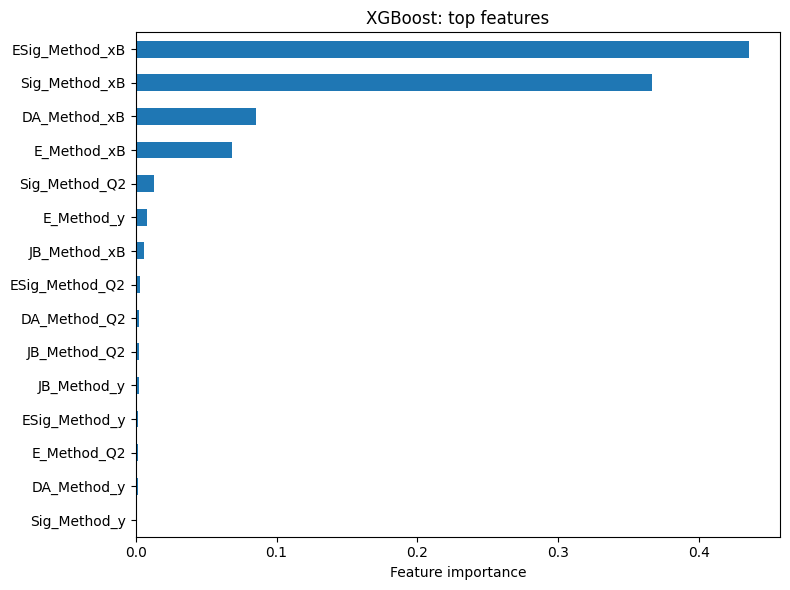

In [29]:
# Best pipeline from GridSearchCV
best_ttr = grid.best_estimator_

# Extract the underlying XGBRegressor
best_xgb = best_ttr.regressor_

# Feature importances aligned to your training columns
imp = pd.Series(best_xgb.feature_importances_, index=X_train.columns).sort_values(ascending=False)

print("Top 20 features:\n", imp.head(20))

# Quick barh plot
topN = 20
plt.figure(figsize=(8, 6))
imp.head(topN).iloc[::-1].plot(kind="barh")
plt.xlabel("Feature importance")
plt.ylabel("")
plt.title("XGBoost: top features")
plt.tight_layout()
plt.show()


# average importances over top-k models

In [30]:
# --- pick which metric to plot ---
metric_name = getattr(grid, "refit", "geo_rmse")        # the one used for refit/sorting
metric_col  = f"metric_{metric_name}"                   # e.g. 'metric_geo_rmse'

# top-K rows by that metric (tbl_sorted already sorted ascending on this metric)
K = min(12, len(tbl_sorted))
labels = tbl_sorted["label"].iloc[:K].tolist()
values = tbl_sorted[metric_col].iloc[:K].astype(float).tolist()

# --- ROOT bar plot ---
import ROOT as root

c = root.TCanvas("c_grid_models", f"Grid models ({metric_name})", 1200, 500)
h = root.TH1F("h_grid_models", f"Grid CV {metric_name} (lower = better);Model;{metric_name}", K, 0.5, K+0.5)
h.Sumw2()

# fill bars + set bin labels (trim to avoid overflow)
for i, (lab, val) in enumerate(zip(labels, values), start=1):
    h.SetBinContent(i, float(val))
    short = (lab[:48] + "…") if len(lab) > 49 else lab
    h.GetXaxis().SetBinLabel(i, short)

# axis cosmetics
h.SetLineWidth(2)
h.SetFillColorAlpha(4, 0.35)         # light blue fill, optional
h.SetMinimum(0.0)
h.SetMaximum(1.10 * max(values) if values else 1.0)

# rotate labels vertically for readability
h.GetXaxis().LabelsOption("v")
h.GetXaxis().SetLabelSize(0.03)
h.GetYaxis().SetTitleOffset(1.1)

h.Draw("BAR2")
c.SetGridy()
c.Draw()
# c.SaveAs(out_folder + f"grid_cv_{metric_name}_bar.png")


# Cross Validation

In [31]:
predicted = grid.predict(X_test)
print(r2_score(y_test, predicted))

0.9555493593215942


# compare best few on the test split

In [32]:
import pandas as pd
import numpy as np
import ROOT as root

# ---- collect CV results
cv = pd.DataFrame(grid.cv_results_)

# discover metric columns (multi-metric)
metric_prefix = "mean_test_"
metric_cols = [c for c in cv.columns if c.startswith(metric_prefix)]
assert metric_cols, "No mean_test_* columns found. Did you pass scoring={...} to GridSearchCV?"

# pick the primary metric = the one used for refit (e.g., 'geo_rmse')
metric_name = getattr(grid, "refit", None)
if not metric_name or metric_name == "score":
    # fallback: first metric in the list
    metric_name = metric_cols[0][len(metric_prefix):]

metric_col  = f"{metric_prefix}{metric_name}"          # e.g. 'mean_test_geo_rmse'
std_col     = f"std_test_{metric_name}"                # e.g. 'std_test_geo_rmse'
rank_col    = f"rank_test_{metric_name}"               # e.g. 'rank_test_geo_rmse'

# sklearn stores NEGATED values when greater_is_better=False -> flip sign back
metric_vals = -cv[metric_col].astype(float)
metric_std  =  cv[std_col].abs().astype(float)
rank_vals   =  cv[rank_col].astype(int)

# param columns (note: TransformedTargetRegressor => 'param_regressor__...')
pcols = [c for c in cv.columns if c.startswith("param_")]

# build tidy table
tbl = pd.DataFrame({c: cv[c] for c in pcols})
tbl[f"metric_{metric_name}"] = metric_vals
tbl[f"metric_{metric_name}_std"] = metric_std
tbl["rank"] = rank_vals
tbl["fit_time"] = cv["mean_fit_time"].astype(float)
tbl["score_time"] = cv["mean_score_time"].astype(float)

# compact label (handle missing keys gracefully)
def p(row, name):
    key = f"param_{name}"
    return row[key] if key in row and pd.notnull(row[key]) else None

def compact_label(row):
    ne  = p(row, "regressor__n_estimators")
    lr  = p(row, "regressor__learning_rate")
    md  = p(row, "regressor__max_depth")
    mcw = p(row, "regressor__min_child_weight")
    lam = p(row, "regressor__reg_lambda")
    ss  = p(row, "regressor__subsample")
    cb  = p(row, "regressor__colsample_bytree")
    cnode = p(row, "regressor__colsample_bynode")
    return f"n={ne}, lr={lr}, d={md}, mcw={mcw}, λ={lam}, subs={ss}, cbt={cb}, cbn={cnode}"

tbl["label"] = tbl.apply(compact_label, axis=1)

# sort by the chosen metric (lower=better)
metric_plot_col = f"metric_{metric_name}"
tbl_sorted = tbl.sort_values(metric_plot_col, ascending=True, kind="mergesort").reset_index(drop=True)

# ---- ROOT bar chart of top-K configs
K = min(12, len(tbl_sorted))
labels = tbl_sorted["label"].iloc[:K].tolist()
vals   = tbl_sorted[metric_plot_col].iloc[:K].astype(float).tolist()
errs   = tbl_sorted[f"{metric_plot_col}_std"].iloc[:K].astype(float).tolist()

c = root.TCanvas("c_grid_models", f"Grid CV {metric_name} (lower = better)", 1200, 500)
c.SetGridy()

h = root.TH1F("h_grid_models",
              f"Grid CV {metric_name} (lower = better);Model;{metric_name}",
              K, 0.5, K+0.5)
h.SetStats(0)
h.SetLineWidth(2)
h.SetFillColorAlpha(root.kAzure-9, 0.8)
h.SetLineColor(root.kAzure+2)
h.SetMinimum(0.0)
h.SetMaximum(1.10 * max(vals) if vals else 1.0)

for i, (lab, v, e) in enumerate(zip(labels, vals, errs), start=1):
    h.SetBinContent(i, float(v))
    h.SetBinError(i, float(e))
    short = (lab[:48] + "…") if len(lab) > 49 else lab
    h.GetXaxis().SetBinLabel(i, short)

# rotate labels for readability
h.GetXaxis().LabelsOption("v")
h.GetXaxis().SetLabelSize(0.03)
h.GetYaxis().SetTitleOffset(1.1)

h.Draw("BAR2")
h.Draw("E1 SAME")
c.Draw()
# c.SaveAs(out_folder + f"/grid_cv_{metric_name}_bar.png")


Warning in <TCanvas::Constructor>: Deleting canvas with same name: c_grid_models
Warning in <TROOT::Append>: Replacing existing TH1: h_grid_models (Potential memory leak).


In [33]:
clf = grid

In [34]:
y_pred = clf.predict(X_test)

In [35]:
idx_test = X_test.index

# Model Evaluation

In [36]:
import pickle
with open('output/bdt_eic_xgboost.pkl','wb') as f:
    pickle.dump(clf,f)

#print(clf.predict(data[0:10]))

PicklingError: Can't pickle <function <lambda> at 0x7f1c06c604c0>: attribute lookup <lambda> on __main__ failed

In [37]:
# ---------------- helpers ----------------
EPS = 1e-12

def valid_mask(var, y_true, y_pred):
    m = np.isfinite(y_true) & np.isfinite(y_pred) & (y_pred > -100)
    if var in ("xB", "y"):
        m &= (y_true >= 0) & (y_true <= 1) & (y_pred >= 0) & (y_pred <= 1)
    elif var == "Q2":
        m &= (y_true > 0) & (y_pred > 0)
    return m

def rescale_w(w):
    return w / (np.mean(w) + EPS)

# log-space RMSE (geo-RMSE): lower is better
def geo_rmse(y_true, y_pred, w):
    zt = np.log(np.maximum(y_true, EPS))
    zp = np.log(np.maximum(y_pred, EPS))
    return np.sqrt(np.average((zp - zt)**2, weights=w))

# relative RMSE on original scale: lower is better
def rel_rmse(y_true, y_pred, w):
    rel = (y_pred - y_true) / np.maximum(y_true, EPS)
    return np.sqrt(np.average(rel**2, weights=w))

# SMAPE (symmetric MAPE): lower is better
def smape(y_true, y_pred, w):
    denom = np.maximum(np.abs(y_true) + np.abs(y_pred), EPS)
    return np.average(np.abs(y_pred - y_true) / denom, weights=w)

# asymmetric penalty for Q2 (overestimation hurts more)
def asym_q2(y_true, y_pred, w, k=4.0, delta=0.01):
    # over-estimate if y_pred > y_true*(1+delta)
    over = y_pred > (1.0 + delta) * y_true
    err2 = (np.log(np.maximum(y_pred, EPS)) - np.log(np.maximum(y_true, EPS)))**2
    w_eff = w * np.where(over, k, 1.0)
    return np.sqrt(np.average(err2, weights=w_eff))

# overshoot rate beyond fractional delta (diagnostic, lower is better)
def overrate(y_true, y_pred, w, delta=0.05):
    m = y_pred > (1.0 + delta) * y_true
    return np.average(m.astype(float), weights=w)

# ---------------- data prep ----------------
VAR = iname[iOption]  # "Q2", "xB", or "y"
y_true = data.loc[idx_test, f"mc_{VAR}"].to_numpy(float)
w      = data.loc[idx_test, "w"].to_numpy(float)

labels, preds = [], []

# ML prediction (from your fitted pipeline)
model = grid.best_estimator_ if ('grid' in globals() and hasattr(grid, 'best_estimator_')) else None
if model is not None:
    Xte = X_test.loc[:, list(model.feature_names_in_)] if hasattr(model, "feature_names_in_") else X_test
    ml_pred = np.asarray(model.predict(Xte), float)
    labels.append("ML"); preds.append(ml_pred)

# Baseline methods
labels.extend(METHODS)
preds.extend([data.loc[idx_test, bname(m, VAR)].to_numpy(float) for m in METHODS])

# ---------------- compute metrics per model ----------------
def metrics_for(y_true, y_pred, w, var):
    m = valid_mask(var, y_true, y_pred)
    if m.sum() == 0:
        return dict(geo=np.nan, rel=np.nan, sm=np.nan, asym=np.nan, over=np.nan, rmse=np.nan)
    ww = rescale_w(w[m])
    yt = y_true[m]; yp = y_pred[m]
    out = dict(
        geo  = geo_rmse(yt, yp, ww),
        rel  = rel_rmse(yt, yp, ww),
        sm   = smape(yt, yp, ww),
        over = overrate(yt, yp, ww, delta=0.05),
    )
    # asymmetric only makes sense/was requested for Q2
    out["asym"] = asym_q2(yt, yp, ww, k=4.0, delta=0.01) if var == "Q2" else np.nan
    return out

all_metrics = [metrics_for(y_true, p, w, VAR) for p in preds]

# choose which metric to display as bars:
# options: 'geo' (recommended), 'rel', 'sm', 'asym' (Q2 only), 'over', 'rmse'
metric_to_plot = "geo" if VAR in ("Q2","xB","y") else "rmse"
values = [m[metric_to_plot] for m in all_metrics]

# ---------------- ROOT bar chart ----------------
cname = f"c_{metric_to_plot}_{VAR}"
title = {
    "geo":"Geo-RMSE (log space)",
    "rel":"Relative RMSE",
    "sm":"SMAPE",
    "asym":"Asymmetric log-RMSE (Q2)",
    "over":"Overshoot rate (>5%)"
}[metric_to_plot]

c = root.TCanvas(cname, f"{title} on test ({VAR})", 800, 500)
h = root.TH1F(f"h_{metric_to_plot}_{VAR}", f"{title} on test ({VAR});Model;{metric_to_plot}",
              len(labels), 0.5, len(labels)+0.5)
h.SetStats(0)
for i, (lab, v) in enumerate(zip(labels, values), 1):
    h.SetBinContent(i, float(v))
    h.GetXaxis().SetBinLabel(i, lab)

h.SetFillColor(root.kAzure-9)
h.SetLineColor(root.kAzure+2)

# log y is nice for rate/geo metrics; keep safe minimum
if metric_to_plot in ("geo","rel","sm","over","rmse","asym"):
    vmin = np.nanmin(values)
    if np.isfinite(vmin) and vmin > 0:
        root.gPad.SetLogy(True)
        h.SetMinimum(0.09)
h.Draw("BAR2")
h.GetYaxis().SetNdivisions(555)    # 5 major divisions × 2 → denser ticks
h.GetYaxis().SetLabelSize(0.045)   # slightly larger text
h.GetYaxis().SetTitleOffset(1.2)
c.Draw()
# c.SaveAs(out_folder + f"/metric_{metric_to_plot}_{VA_


In [38]:
# ---------- ML pred if available (robust) ----------
ml_pred = None

def _predict_with(model, Xref):
    """Safe predict that respects training column order if available."""
    cols = list(getattr(model, "feature_names_in_", Xref.columns))
    Xuse = Xref.loc[:, cols] if cols else Xref
    return np.asarray(model.predict(Xuse), dtype=float)

# 1) precomputed predictions take priority
if "ml_preds" in globals() and isinstance(ml_preds, dict) and (VAR in ml_preds):
    ml_pred = np.asarray(ml_preds[VAR], dtype=float)

# 2) a per-variable models dict, e.g. models_by_var = {"Q2": model_q2, "xB": model_xB, "y": model_y}
elif "models_by_var" in globals() and isinstance(models_by_var, dict) and (VAR in models_by_var):
    try:
        ml_pred = _predict_with(models_by_var[VAR], X_test)
    except Exception:
        ml_pred = None

# 3) a single named model (your earlier code only supported Q2)
elif VAR == "Q2" and "model_q2" in globals():
    try:
        ml_pred = _predict_with(model_q2, X_test)
    except Exception:
        ml_pred = None

# 4) a recent GridSearchCV / fitted pipeline in 'grid'
elif "grid" in globals() and hasattr(grid, "best_estimator_") and grid.best_estimator_ is not None:
    try:
        ml_pred = _predict_with(grid.best_estimator_, X_test)
    except Exception:
        ml_pred = None

# 5) other common names you might have
elif "best_ttr" in globals():
    try:
        ml_pred = _predict_with(best_ttr, X_test)
    except Exception:
        ml_pred = None

# finally, include ML if we actually have predictions of correct length
if (ml_pred is not None) and (len(ml_pred) == len(y_true)):
    labels.append("ML")
    preds.append(ml_pred)


In [39]:
def make_h2_empty(name, title, x_edges, y_edges):
    h = root.TH2D(name, title, len(x_edges)-1, x_edges, len(y_edges)-1, y_edges)
    h.Sumw2()
    h.SetDirectory(0)
    return h

def fill_residual_h2(name, var_true, var_pred, weights, x_edges, y_edges):
    h = make_h2_empty(name, f"{name};{iname[iOption]}_{{true}}; ({iname[iOption]}_{{pred}}-{iname[iOption]}_{{true}})/{iname[iOption]}_{{true}}",
                      x_edges, y_edges)
    for vt, vp, w in zip(var_true, var_pred, weights):
        if not np.isfinite(vt) or not np.isfinite(vp) or vt <= 0: 
            continue
        r = (vp - vt) / vt
        h.Fill(vt, r, float(w))
    return h

def make_profile_over_h2(h2, name):
    # mean vs X with error bars = RMS per bin
    prof = h2.ProfileX(f"p_{name}", 1, -1, "")  # build profile
    prof.SetErrorOption("s")                    # 's' => spread (std dev) as error bar
    prof.SetMarkerStyle(20); prof.SetMarkerSize(0.8); prof.SetLineWidth(2)
    prof.SetDirectory(0)
    return prof

# ---------- build histos ----------
histos_q2 = {}
profiles_q2 = {}

# index of test samples to pull baselines aligned with y_test
idx_test = X_test.index


pred_ml = model.predict(X_test)
# ML
histos_q2["ML"] = fill_residual_h2("ML_Q2res_vs_true",
                                   y_test.values,
                                   pred_ml,
                                   w_test.values,
                                   all_edges[iname[iOption]], res_edges)
profiles_q2["ML"] = make_profile_over_h2(histos_q2["ML"], "ML")

# baselines: each method m's reconstructed Q2
for m in METHODS:
    pred_base = data.loc[idx_test, bname(m, iname[iOption])].to_numpy()
    h2 = fill_residual_h2(f"{m}_{{iname[iOption]}}res_vs_true",
                          y_test.values,
                          pred_base,
                          w_test.values,
                          all_edges[iname[iOption]], res_edges)
    histos_q2[m] = h2
    profiles_q2[m] = make_profile_over_h2(h2, m)

# ---------- draw grid: heatmaps + profile overlays ----------
names = ["ML"] + METHODS  # order on canvas
cols = 3
rows = int(np.ceil(len(names)/float(cols)))
c = root.TCanvas(f"c_{iname[iOption]}_res_profiles", f"{iname[iOption]} residual vs true (ROOT)", 1600, 950)
c.Divide(cols, rows)

for i, key in enumerate(names, 1):
    pad = c.cd(i)
    pad.SetLogx()
    h2 = histos_q2[key]
    h2.SetTitle(f"{key}: {iname[iOption]} residual vs true;{iname[iOption]}_{{true}};({iname[iOption]}_{{pred}}-{iname[iOption]}_{{true}})/{iname[iOption]}_{{true}}")
    h2.Draw("COLZ")
    profiles_q2[key].Draw("E1 SAME")

c.Draw()


In [40]:
def fill_true_pred_h2(name, q2_true, q2_pred, weights, edges):
    h = root.TH2D(name, f"{name};{iname[iOption]}_{{true}};{iname[iOption]}_{{pred}}",
                  len(edges)-1, edges, len(edges)-1, edges)
    h.Sumw2(); h.SetDirectory(0)
    for qt, qp, w in zip(q2_true, q2_pred, weights):
        if not np.isfinite(qt) or not np.isfinite(qp) or qt<=0 or qp<=0: 
            continue
        h.Fill(qt, qp, float(w))
    return h

# ML
h2_ml_cal = fill_true_pred_h2("ML_Q2pred_vs_true", y_test.values, pred_ml, w_test.values, all_edges[iname[iOption]])

# a baseline (e.g., E)
pred_E = data.loc[idx_test, bname("ESig", iname[iOption])].to_numpy()
h2_E_cal = fill_true_pred_h2("E_Q2pred_vs_true", y_test.values, pred_E, w_test.values, all_edges[iname[iOption]])

c2 = root.TCanvas(f"c_{iname[iOption]}_calib", f"{iname[iOption]} calibration (pred vs true)", 1100, 500)
c2.Divide(2,1)
lines =[]
for i, (title, h2) in enumerate([("ML", h2_ml_cal), ("ESig", h2_E_cal)], 1):
    pad = c2.cd(i)
    pad.SetLogx()
    pad.SetLogy()
    h2.SetTitle(f"{title}: {iname[iOption]}_{{pred}} vs {iname[iOption]}_{{true}};{iname[iOption]}_{{true}};{iname[iOption]}_{{pred}}")
    h2.Draw("COLZ")
    # diagonal
    x0, x1 = all_edges[iname[iOption]][0], all_edges[iname[iOption]][-1]
    lines.append(root.TLine(x0, x0, x1, x1))
    lines[-1].SetLineStyle(2)
    lines[-1].SetLineWidth(2)
    lines[-1].Draw("SAME")

c2.Draw()
c2.SaveAs(f"{out_folder}/q2_pred_vs_true_ROOT.png")


Info in <TCanvas::Print>: png file output/QA//q2_pred_vs_true_ROOT.png has been created


In [41]:
# Helper if not already defined
if "fill_residual_h2" not in globals():
    def fill_residual_h2(name, var_true, var_pred, weights, x_edges, y_edges):
        h = root.TH2D(name, f"{name};{iname[iOption]}_{{true}};({iname[iOption]}_{{pred}}-{iname[iOption]}_{{true}})/{iname[iOption]}_{{true}}",
                      len(x_edges)-1, x_edges, len(y_edges)-1, y_edges)
        h.Sumw2(); h.SetDirectory(0)
        for vt, vp, w in zip(var_true, var_pred, weights):
            if not np.isfinite(vt) or not np.isfinite(vp) or vt <= 0: 
                continue
            r = (vp - vt) / vt
            h.Fill(vt, r, float(w))
        return h

# Build histos (ML and baseline E)
h2_ml_res = fill_residual_h2("ML_Q2res_vs_true", y_test.values, pred_ml, w_test.values, all_edges[iname[iOption]], res_edges)

pred_E = data.loc[idx_test, bname("E", iname[iOption])].to_numpy()
h2_E_res = fill_residual_h2(f"E_{iname[iOption]}res_vs_true",  y_test.values, pred_E,  w_test.values, all_edges[iname[iOption]], res_edges)

# Draw side-by-side
c3 = root.TCanvas("c_q2_residuals", "Q2 residual vs true", 1100, 500)
c3.Divide(2,1)

for i, (title, h2) in enumerate([("ML", h2_ml_res), ("E", h2_E_res)], 1):
    pad = c3.cd(i)
    pad.SetLogx()  # only x is log; residual can be negative
    h2.SetTitle(f"{title}: ({iname[iOption]}_{{pred}}-{iname[iOption]}_{{true}})/{iname[iOption]}_{{true}} vs {iname[iOption]}_{{true}};"
                f"{iname[iOption]}"+r"_{\rm true};"+f"({iname[iOption]}"+r"_{\rm pred}-"+f"{iname[iOption]}_"+r"{\rm true})"+f"/{iname[iOption]}"+r"_{\rm true}")
    h2.Draw("COLZ")

    # horizontal zero line
    x0, x1 = all_edges[iname[iOption]][0], all_edges[iname[iOption]][-1]
    zline = root.TLine(x0, 0.0, x1, 0.0)
    zline.SetLineStyle(2); zline.SetLineWidth(2)
    zline.Draw("SAME")

    prof = h2.ProfileX(f"p_{h2.GetName()}")
    prof.SetErrorOption("s")     # RMS as error
    prof.SetMarkerStyle(20); prof.SetMarkerSize(0.8); prof.SetLineWidth(2)
    prof.Draw("E1 SAME")


c3.Draw()
# c3.SaveAs(f"{out_folder}/q2_residual_vs_true_ROOT.png")


In [42]:
# After you've done: gb_clf.fit(X_train, y_train)  (or grid.best_estimator_.fit(...))
try:
    model_q2 = grid.best_estimator_
except Exception:
    print("FUCK")

# Store metadata so we can reuse predict() safely
model_q2._target_var = iname[iOption]
model_q2._feature_names = list(X_train.columns)


In [43]:
import pickle
# load
with open('output/bdt_eic.pkl', 'rb') as f:
    clf2 = pickle.load(f)
#print(clf2.predict(kek_data[0:10]))

EOFError: Ran out of input

In [ ]:
sub_tree_42 = clf2.best_estimator_[0, 0]
from sklearn.tree import export_graphviz, export_text
from sklearn.tree import _tree
# Visualization
# Install graphviz: https://www.graphviz.org/download/
from pydotplus import graph_from_dot_data
from IPython.display import Image
dot_data = export_graphviz(
    sub_tree_42,
    out_file=None, filled=True, rounded=True,
    special_characters=True,
    proportion=False, impurity=False, # enable them if you want
)

graph = graph_from_dot_data(dot_data)
png = graph.create_png()
# Save (optional)
from pathlib import Path
Path('output/out.png').write_bytes(png)
# Display
Image(png)

NameError: name 'clf2' is not defined

In [ ]:
stop

NameError: name 'stop' is not defined

In [ ]:
clf2.predict(kek_data[0:100])

array([1.45309034, 2.41025975, 1.09059326, 1.58014581, 1.93927352,
       3.01281504, 1.34536675, 0.96826292, 2.84778562, 2.53125445,
       1.83544092, 1.37836771, 4.00189835, 1.52610228, 2.44739246,
       1.75695736, 1.20598623, 1.79596832, 1.21182441, 1.6681236 ,
       2.29702089, 1.91884656, 2.43886722, 1.60180438, 2.69448223,
       1.38552171, 1.3860337 , 1.21450506, 1.91974504, 1.78799557,
       1.81302179, 1.55928357, 1.09935729, 1.80041654, 0.98784812,
       2.40286379, 2.41888584, 2.81941232, 1.77812028, 2.356808  ,
       1.23154248, 1.30711983, 2.27494929, 4.32262364, 1.26484071,
       2.24730434, 3.02395892, 1.64368477, 1.39947394, 1.18968571,
       1.8074917 , 1.42038186, 1.17648258, 1.90810408, 1.09868586,
       2.10062345, 1.58411898, 1.38850379, 2.13083919, 2.66000674,
       1.42504089, 1.30271891, 1.47658468, 1.53859422, 1.50401412,
       2.03568899, 1.39079196, 1.88056567, 1.19853296, 1.21060762,
       1.42097641, 1.07771313, 3.13909991, 1.97824977, 1.36625

In [ ]:
clf2.predict_proba(kek_data[0:100])

AttributeError: This 'GridSearchCV' has no attribute 'predict_proba'

In [ ]:
print( clf2.best_params_)

{'criterion': 'squared_error', 'learning_rate': 0.2, 'loss': 'log_loss', 'max_depth': 12, 'max_features': 'log2', 'min_samples_split': 0.01, 'n_estimators': 20}


In [ ]:
clf2.best_estimator_.predict_proba(kek_data[9:20])

array([[0.07672582, 0.92327418],
       [0.94052226, 0.05947774],
       [0.96925715, 0.03074285],
       [0.9255942 , 0.0744058 ],
       [0.95790885, 0.04209115],
       [0.17484507, 0.82515493],
       [0.90801663, 0.09198337],
       [0.97470102, 0.02529898],
       [0.96998563, 0.03001437],
       [0.96542442, 0.03457558],
       [0.68789436, 0.31210564]])

In [ ]:
y = clf2.best_estimator_[0, 0].predict(kek_data[9:19].values.tolist())*0
#y = gb_clf.decision_function(kek_data[9:20])

rate = clf2.best_params_['learning_rate']
print(rate)
for i in range(0,10):
    sub_tree = clf2.best_estimator_[i, 0]
    y += rate*sub_tree.predict(kek_data[9:19].values.tolist())
print(y)
print(gb_clf.decision_function(kek_data[9:20]))
z=y
for i in range(len(z)): 
    z[i] = 1./(1+np.exp(-z[i]))
print(z)

0.2
[ 1.94127665 -2.35907336 -2.36641299 -1.76645893 -2.3498593   0.48130882
 -1.21224177 -2.3937125  -2.45371886 -2.35907336]
[-3.69741832 -3.20457348 -4.43349033 -3.12136151 -3.39189598 -3.78777519
 -3.09513097 -3.81029894 -4.23134002 -3.26306616 -2.83861437]
[0.87449233 0.08634727 0.08576999 0.14598325 0.08707696 0.61805689
 0.22930464 0.08365341 0.07916702 0.08634727]


In [ ]:
best_gbc = clf2.best_estimator_

In [ ]:
n_estim = best_gbc.n_estimators

In [ ]:
learning_rate = best_gbc.learning_rate
print(clf2.decision_function(kek_data[9:19]))
arr = clf2.decision_function(kek_data[9:19])
print(1./(1.+np.exp(-arr)))
#tree_scores = [best_gbc.estimators_[i, 0].decision_function(kek_data[9:19].values.tolist()) for i in range(10)]
print(learning_rate)

[ 2.48768796 -2.76083312 -3.45087239 -2.520902   -3.12491509  1.55167093
 -2.28965489 -3.65136666 -3.47560485 -3.32942029]
[0.92327418 0.05947774 0.03074285 0.0744058  0.04209115 0.82515493
 0.09198337 0.02529898 0.03001437 0.03457558]
0.2


In [ ]:
log_odds_predictions = []
for tree in clf2.best_estimator_:
    # For each tree, get the predicted values for each sample
    leaf_indices = tree[0].apply(kek_data[9:19].values.tolist())  # Get the leaf indices for the training data
    leaf_values = tree[0].tree_.value  # Get the values at each leaf

    # Average the values for each leaf to interpret them as log odds
    predicted_log_odds = [leaf_values[leaf_indices[i]].mean() for i in range(len(kek_data[9:19]))]
    log_odds_predictions.append(predicted_log_odds)

In [ ]:
print(log_odds_predictions)

[[-1.200624512099922, -1.8972357767003818, -1.9895663205743614, -1.6814882493274452, -1.8959555879763763, -0.34568836462673375, -1.8551203846226936, -1.9345894979262641, -1.9106729177434207, -1.8972357767003818], [-0.9171851259767482, -1.5823254008503425, -1.587503998644066, -1.542846112360411, -1.587503998644066, -0.8388272699490528, -1.5823254008503425, -1.587503998644066, -1.578659801324435, -1.5823254008503425], [1.826983590463873, -1.342027522547931, -1.3798789331792816, -1.3693805745914267, -1.3310208634481397, 1.826983590463873, -1.3291769712940058, -1.3985833963429382, -1.376432121760617, -1.342027522547931], [0.2056563634540976, -1.215986289370081, -1.280018789147165, -1.252056182527864, -1.2261853528178022, 0.0481771596605836, -1.2110563970128718, -1.2419598891099737, -1.3193633222306484, -1.215986289370081], [1.8680051722267956, -1.1633336642755425, -1.1183188238434474, -0.5345410942307353, -1.1520258824134673, 1.8680051722267956, -0.9635131780834657, -1.1633336642755425, -1

In [ ]:
rate = clf2.best_params_['learning_rate']
myarr = [log_odds_predictions[i][0] for i in range(10)]
print(rate,rate*sum(myarr))
print(clf2.decision_function(kek_data[9:19]))

0.2 1.9412766546472733
[ 2.48768796 -2.76083312 -3.45087239 -2.520902   -3.12491509  1.55167093
 -2.28965489 -3.65136666 -3.47560485 -3.32942029]


In [ ]:
print(best_gbc.estimators_.shape[0])
print(best_gbc.estimators_.shape[1])
y = []
for i in range(10):
    y0=[]
    for j in range(n_estim):
        sub_tree = clf2.best_estimator_[j, 0]
        y0.append(sub_tree.predict(kek_data[9+i:10+i].values.tolist())[0])
    y.append(y0)
print(y)

20
1
[[-1.200624512099922, -0.9171851259767482, 1.826983590463873, 0.2056563634540976, 1.8680051722267956, 1.6829132038178136, 1.3978147757965822, 1.3103207102666945, 1.6467431067430889, 1.88575598854409, 1.1536355145443369, 0.8152277437942979, 0.5149847061741806, 0.2617318927990144, 0.9355408312636289, -0.3265557729248271, -0.12416538134348659, 0.7468589834332378, -0.9184963061898156, -0.32670569801241695], [-1.8972357767003818, -1.5823254008503425, -1.342027522547931, -1.215986289370081, -1.1633336642755425, -1.0756564849721666, -1.0074518401169066, -0.9259988852057675, -0.8587809061735233, -0.7265700209338551, -0.7530025649335593, -0.5900907361753928, -0.6051274394850223, -0.6329447146296465, 1.5253392697599892, -0.5001264035722037, -0.44779986646729886, -0.3771992017635802, -0.19504832427241817, 0.567201188755075], [-1.9895663205743614, -1.587503998644066, -1.3798789331792816, -1.280018789147165, -1.1183188238434474, -1.0586109465745617, -0.9367492494761868, -0.8649203507747674, -0

In [ ]:
def get_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    feature_name = [
        #feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        f'x[{i}]' if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    paths = []
    path = []
    
    def recurse(node, path, paths):
        
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 5)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 5)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]
            
    recurse(0, path, paths)

    # sort by samples count
    samples_count = [p[-1][1] for p in paths]
    ii = list(np.argsort(samples_count))
    paths = [paths[i] for i in reversed(ii)]
    
    rules = []
    for path in paths:
        rule = "if ( "
        
        for p in path[:-1]:
            if rule != "if ( ":
                rule += " && "
            rule += str(p)
        rule += " ) "
        if class_names is None:
            rule += " return "+str(np.round(path[-1][0][0][0],30))
        else:
            classes = path[-1][0][0]
            l = np.argmax(classes)
            rule += f"class: {class_names[l]} (proba: {np.round(100.0*classes[l]/np.sum(classes),20)}%)"
        rule += f";  // | based on {path[-1][1]:,} samples"
        rules += [rule]
        
    return rules


In [ ]:
import numpy as np
from sklearn.tree import _tree
def get_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    feature_name = [
        #feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        f'x[{i}]' if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    paths = []
    path = []
    
    def recurse(node, path, paths):
        
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 5)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 5)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]
            
    recurse(0, path, paths)

    # sort by samples count
    samples_count = [p[-1][1] for p in paths]
    ii = list(np.argsort(samples_count))
    paths = [paths[i] for i in reversed(ii)]
    
    rules = []
    for path in paths:
        rule = "if  "
        
        for p in path[:-1]:
            if rule != "if  ":
                rule += " if "
            rule += str(p)
        rule += "  "
        if class_names is None:
            rule += " return "+str(np.round(path[-1][0][0][0],30))
        else:
            classes = path[-1][0][0]
            l = np.argmax(classes)
            rule += f"class: {class_names[l]} (proba: {np.round(100.0*classes[l]/np.sum(classes),20)}%)"
        rule += f";  // | based on {path[-1][1]:,} samples"
        rules += [rule]
        
    return rules

In [ ]:
column_headers = list(kek_data.columns.values)
print(column_headers)
print(len(column_headers))

['NBDThit', 'Pt', 'Phi0', 'The0', 'PhiDC', 'ZDC', 'Alpha', 'Ecore', 'Centrality', 'Charge', 'Arm', 'sdphi0', 'sdthe0', 'SecondHitPhiR0', 'SecondHitPhiL0', 'SecondHitTheR0', 'SecondHitTheL0', 'sdphi1', 'sdthe1', 'SecondHitPhiR1', 'SecondHitPhiL1', 'SecondHitTheR1', 'SecondHitTheL1', 'sdphi2', 'sdthe2', 'SecondHitPhiR2', 'SecondHitPhiL2', 'SecondHitTheR2', 'SecondHitTheL2', 'sdphi3', 'sdthe3', 'SecondHitPhiR3', 'SecondHitPhiL3', 'SecondHitTheR3', 'SecondHitTheL3']
35


In [ ]:
#print(f"double mytree{list(kek_data.columns)}")
print('{')
for iestim in range(n_estim):
    print(f"    if (iestim == {iestim})")
    print('    {')
    sub_tree = clf2.best_estimator_[iestim, 0]
    rules = get_rules(sub_tree, list(kek_data.columns), None)
    for r in rules:
        print("       ",r)
    print('    }')
print ('    return -9999;')
print('};')

{
    if (iestim == 0)
    {
        if  (x[22] <= -25.88281) if (x[19] <= -16.72656) if (x[1] <= 2.02051) if (x[25] > -99.03125) if (x[14] <= 55.01562) if (x[0] <= 5.5) if (x[1] <= 1.22705) if (x[15] > -157.1875) if (x[13] > -99.03125) if (x[30] <= -7.5) if (x[23] > -4.90039) if (x[11] <= 0.86597)   return -1.8959555879763763;  // | based on 302,416 samples
        if  (x[22] <= -25.88281) if (x[19] <= -16.72656) if (x[1] <= 2.02051) if (x[25] > -99.03125) if (x[14] <= 55.01562) if (x[0] <= 5.5) if (x[1] <= 1.22705) if (x[15] > -157.1875) if (x[13] > -99.03125) if (x[30] > -7.5) if (x[0] > 2.5) if (x[24] <= -2.33496)   return -1.8972357767003818;  // | based on 203,119 samples
        if  (x[22] <= -25.88281) if (x[19] <= -16.72656) if (x[1] > 2.02051) if (x[15] > 0.05089) if (x[6] > -0.04008) if (x[11] <= 2.79004) if (x[18] > -1.18408) if (x[13] <= 43.32812)   return 2.0;  // | based on 201,359 samples
        if  (x[22] <= -25.88281) if (x[19] <= -16.72656) if (x[1] <= 2.02051) if (

In [ ]:
def get_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    feature_name = [
        f'x[{i}]' if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    paths = []
    path = []
    
    def recurse(node, path, paths):
        
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 5)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 5)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]
            
    recurse(0, path, paths)

    # sort by samples count
    samples_count = [p[-1][1] for p in paths]
    ii = list(np.argsort(samples_count))
    paths = [paths[i] for i in reversed(ii)]
    
    rules = []
    for path in paths:
        rule = "if "
        
        for p in path[:-1]:
            if rule != "if ":
                rule += " and "
            rule += str(p)
        rule += " : "
        if class_names is None:
            rule += " return "+str(np.round(path[-1][0][0][0],30))
        else:
            classes = path[-1][0][0]
            l = np.argmax(classes)
            rule += f"class: {class_names[l]} (proba: {np.round(100.0*classes[l]/np.sum(classes),20)}%)"
        rule += f"  # | based on {path[-1][1]:,} samples"
        rules += [rule]
        
    return rules


In [ ]:
print(f"def mytree( iestim,  x ) :")
for iestim in range(n_estim):
    print(f"    if iestim == {iestim}:")
    sub_tree = clf2.best_estimator_[iestim, 0]
    rules = get_rules(sub_tree, list(kek_data.columns), None)
    for r in rules:
        print("       ",r)
print ('    return -9999')

def mytree( iestim,  x ) :
    if iestim == 0:
        if (x[22] <= -25.88281) and (x[19] <= -16.72656) and (x[1] <= 2.02051) and (x[25] > -99.03125) and (x[14] <= 55.01562) and (x[0] <= 5.5) and (x[1] <= 1.22705) and (x[15] > -157.1875) and (x[13] > -99.03125) and (x[30] <= -7.5) and (x[23] > -4.90039) and (x[11] <= 0.86597) :  return -1.8959555879763763  # | based on 302,416 samples
        if (x[22] <= -25.88281) and (x[19] <= -16.72656) and (x[1] <= 2.02051) and (x[25] > -99.03125) and (x[14] <= 55.01562) and (x[0] <= 5.5) and (x[1] <= 1.22705) and (x[15] > -157.1875) and (x[13] > -99.03125) and (x[30] > -7.5) and (x[0] > 2.5) and (x[24] <= -2.33496) :  return -1.8972357767003818  # | based on 203,119 samples
        if (x[22] <= -25.88281) and (x[19] <= -16.72656) and (x[1] > 2.02051) and (x[15] > 0.05089) and (x[6] > -0.04008) and (x[11] <= 2.79004) and (x[18] > -1.18408) and (x[13] <= 43.32812) :  return 2.0  # | based on 201,359 samples
        if (x[22] <= -25.88281) and (x[19

In [ ]:
def mytree(x,y):
    return 0

In [ ]:
def mygradboost (x, lerning_rate = 0.2):
    prob = 0
    for i in range (n_estim):
        prob+=lerning_rate*mytree(i, x)
    return 1. / ( 1. + np.exp( - prob ) )


In [ ]:
def mybdt(x, prob):
    if mygradboost(x)>prob: return 1
    return  

In [ ]:
iestim = 9
sub_tree = clf2.best_estimator_[iestim, 0]
y = sub_tree.predict(kek_data[9:19].values.tolist())
print(y)

myf = [mytree(iestim, kek_data[9+i:10+i].values.tolist()[0]) for i in range(10)]
print(myf)

[ 1.88575599 -0.72657002 -0.76234702  0.18790994 -0.93098879 -0.66466124
  4.73576223 -0.80251329 -0.88380734 -0.72657002]
[1.8857559885440898, -0.7265700209338551, -0.7623470226329747, 0.1879099445346337, -0.9309887901848545, -0.6646612392445693, 4.735762228993647, -0.8025132900800463, -0.8838073380277853, -0.7265700209338551]


In [ ]:
iestim = 9
sub_tree = clf2.best_estimator_
y = sub_tree.predict_proba(kek_data[9:19].values.tolist())
print(y)

myf = [mygradboost(kek_data[9+i:10+i].values.tolist()[0]) for i in range(10)]
print(myf)

[[0.07672582 0.92327418]
 [0.94052226 0.05947774]
 [0.96925715 0.03074285]
 [0.9255942  0.0744058 ]
 [0.95790885 0.04209115]
 [0.17484507 0.82515493]
 [0.90801663 0.09198337]
 [0.97470102 0.02529898]
 [0.96998563 0.03001437]
 [0.96542442 0.03457558]]
[0.9232741801306895, 0.05947774419726638, 0.03074285341656859, 0.07440580097390123, 0.04209115136676752, 0.8251549348771924, 0.09198336995736425, 0.025298980961941202, 0.030014374149645494, 0.03457557581298993]


/home/yoren/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
